In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import statsmodels.api as sm

In [2]:
df = pd.read_csv("cleaned_data\\24timestep1h.csv", parse_dates=['tstp', 'date'])

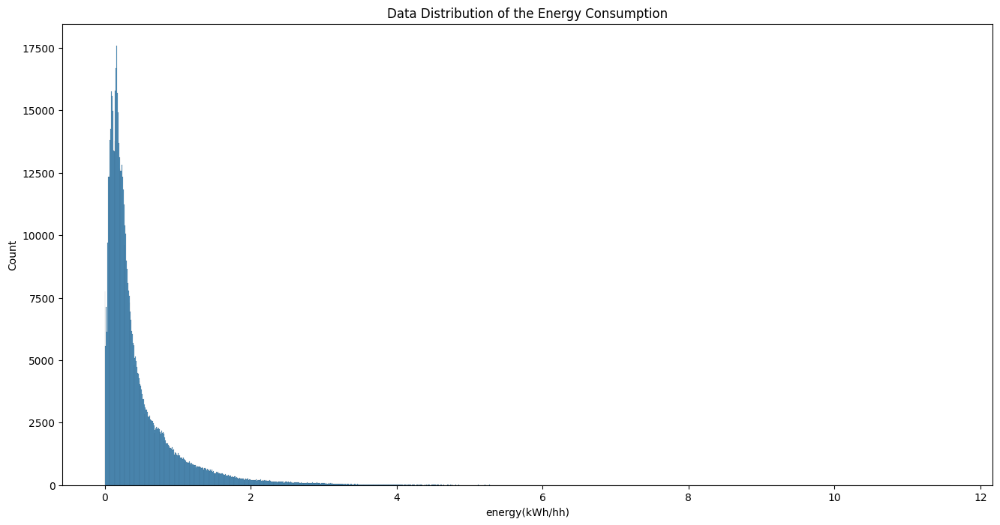

In [10]:
plt.figure(figsize=(16, 8))
sns.histplot(data=df, x='energy(kWh/hh)')
plt.title("Data Distribution of the Energy Consumption")
plt.show()

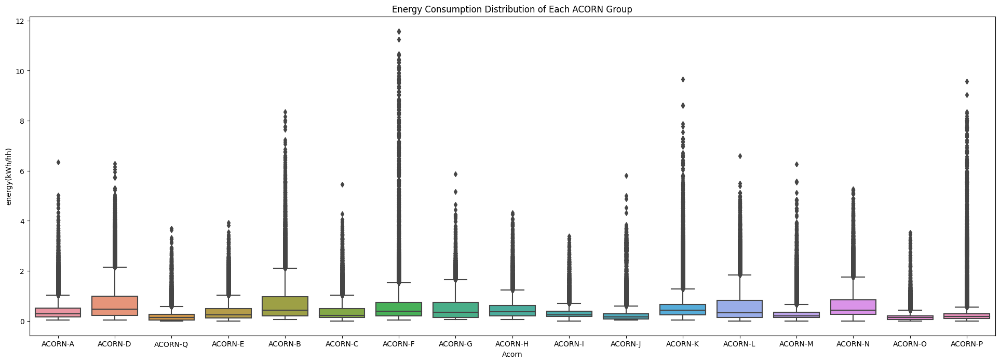

In [11]:
plt.figure(figsize=(24, 8))
sns.boxplot(data=df, x='Acorn', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution of Each ACORN Group")
plt.show()

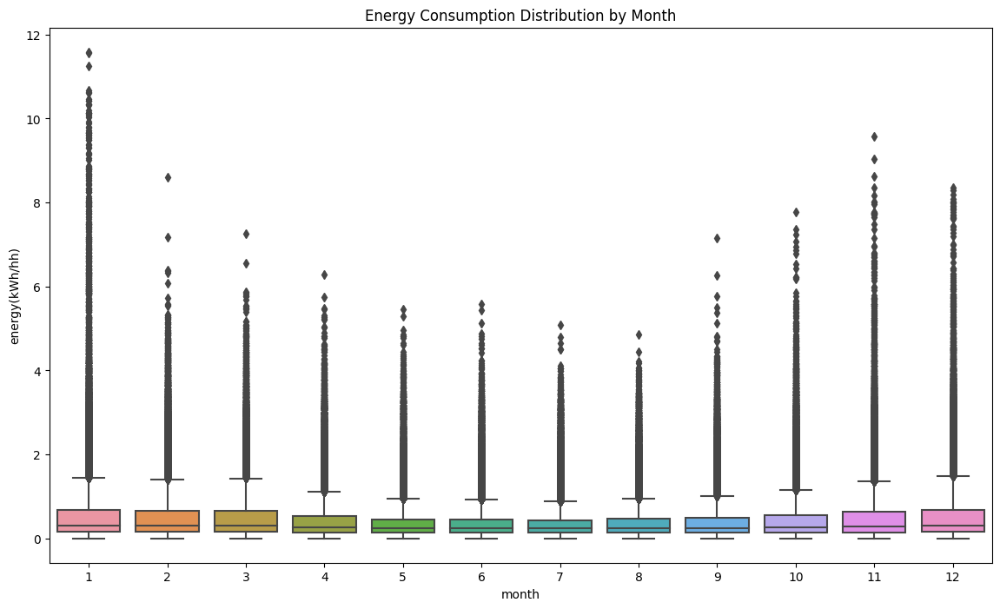

In [17]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='month', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by Month")
plt.show()

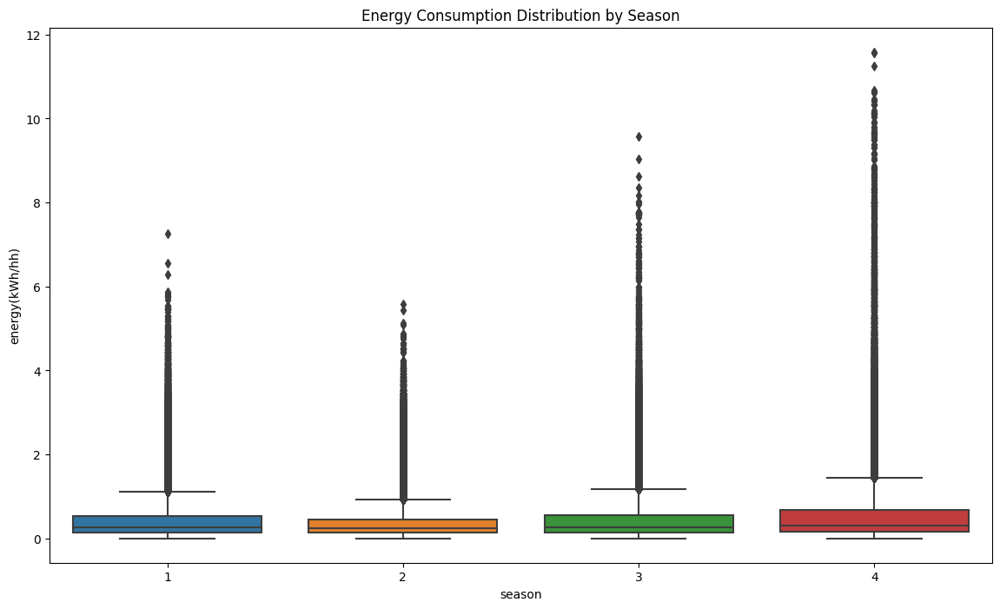

In [20]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='season', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by Season")
plt.show()

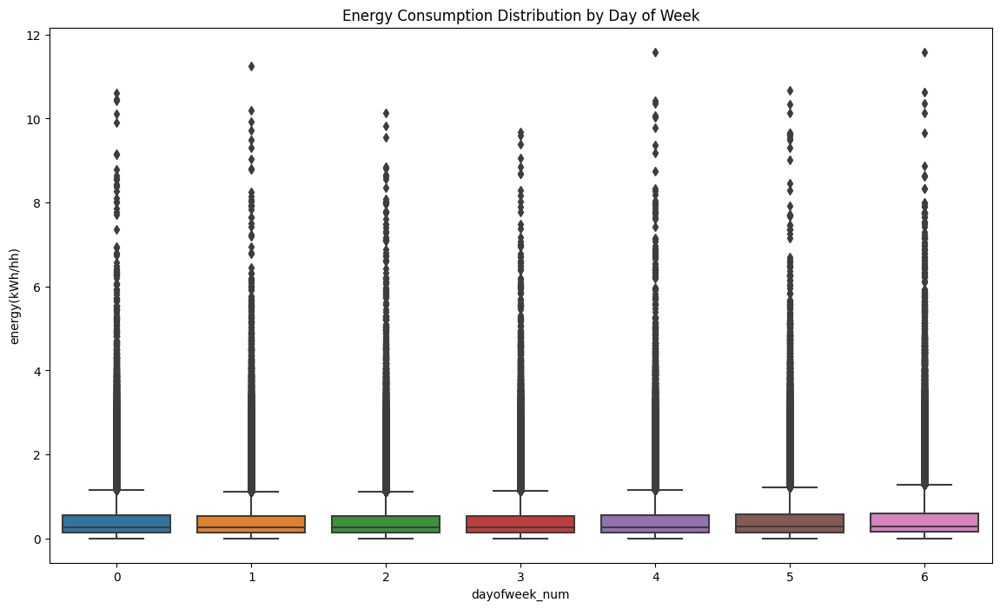

In [21]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='dayofweek_num', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by Day of Week")
plt.show()

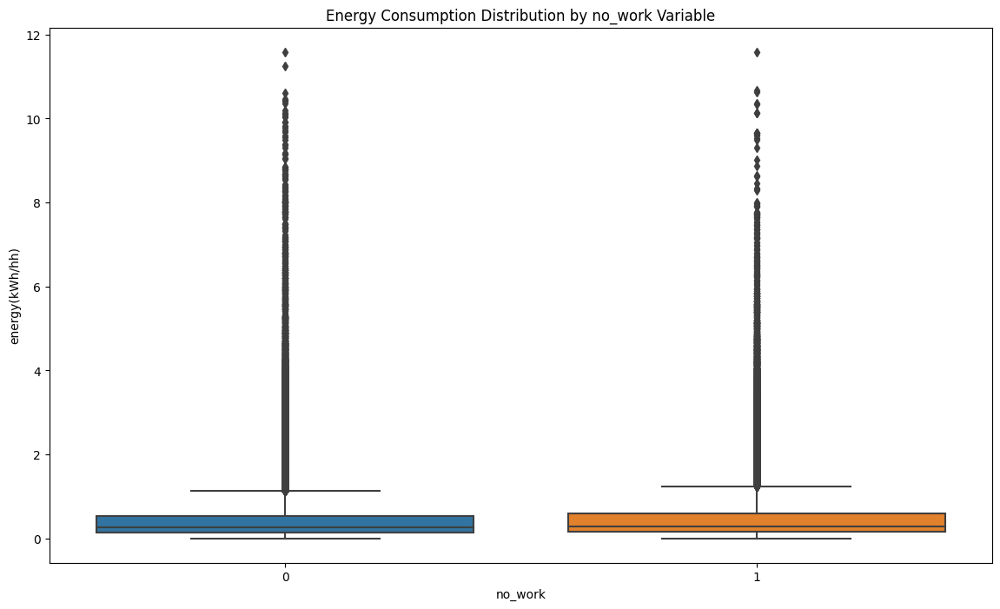

In [22]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='no_work', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by no_work Variable")
plt.show()

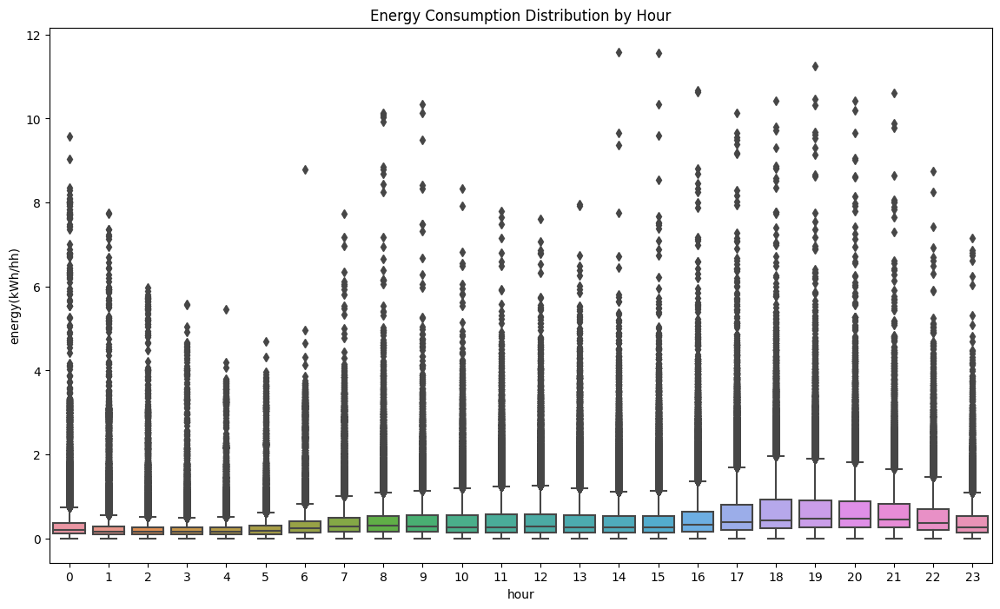

In [23]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='hour', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by Hour")
plt.show()

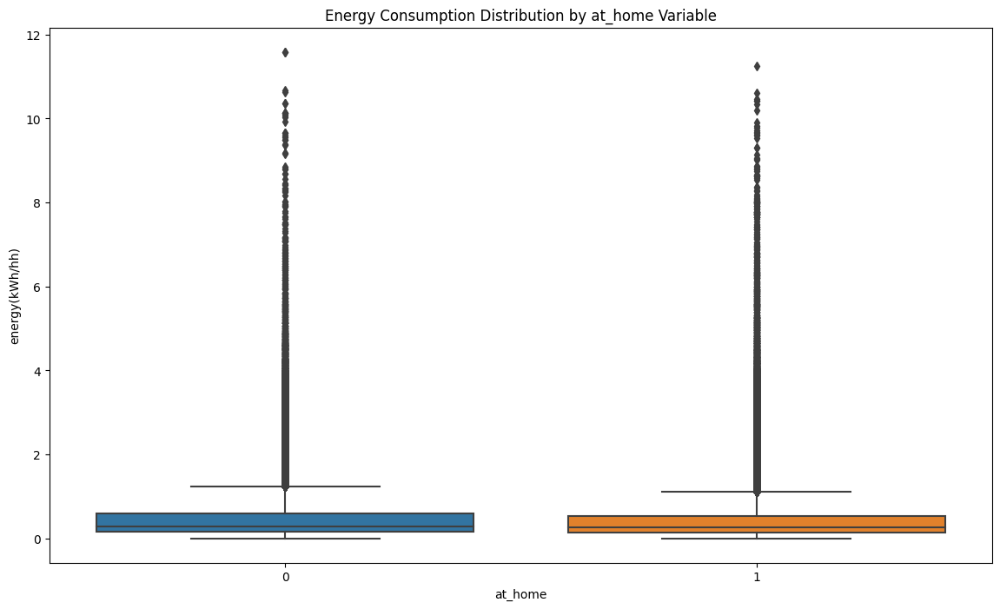

In [24]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='at_home', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by at_home Variable")
plt.show()

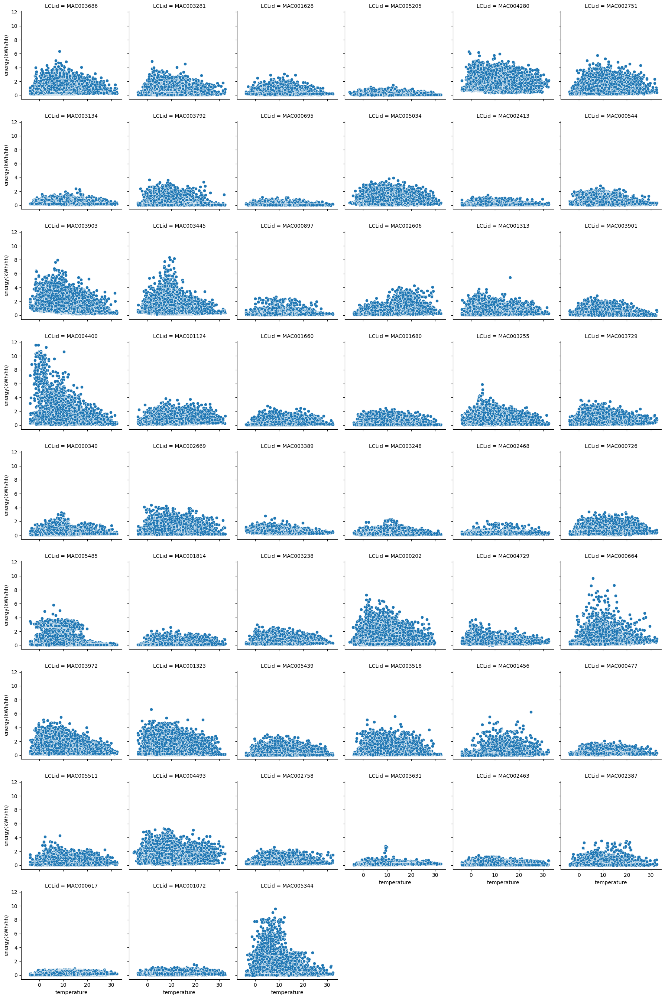

In [88]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="temperature", y="energy(kWh/hh)")

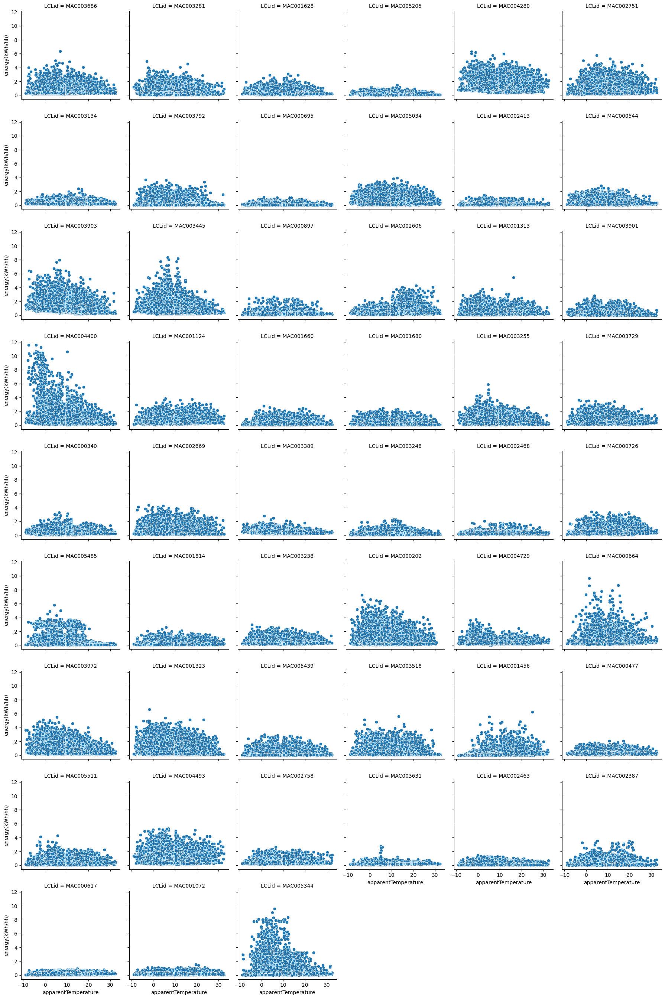

In [89]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="apparentTemperature", y="energy(kWh/hh)")

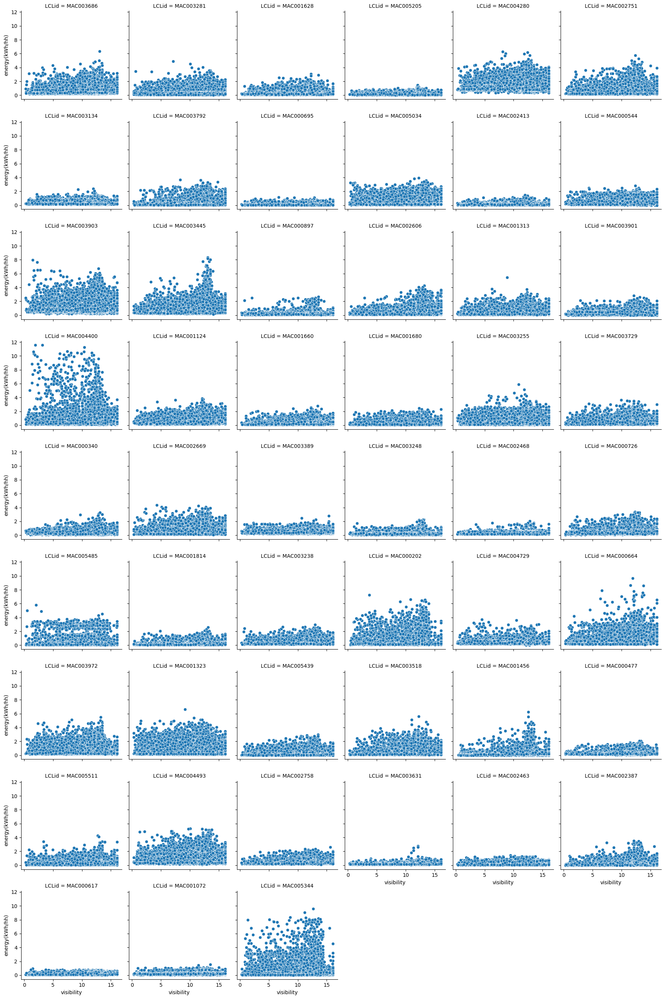

In [90]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="visibility", y="energy(kWh/hh)")

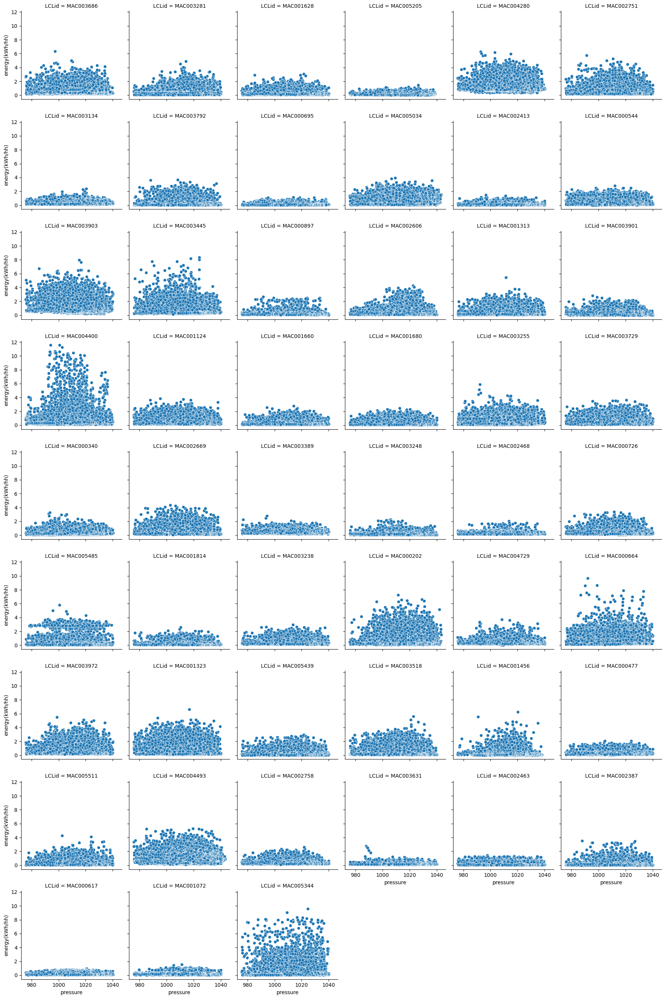

In [91]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="pressure", y="energy(kWh/hh)")

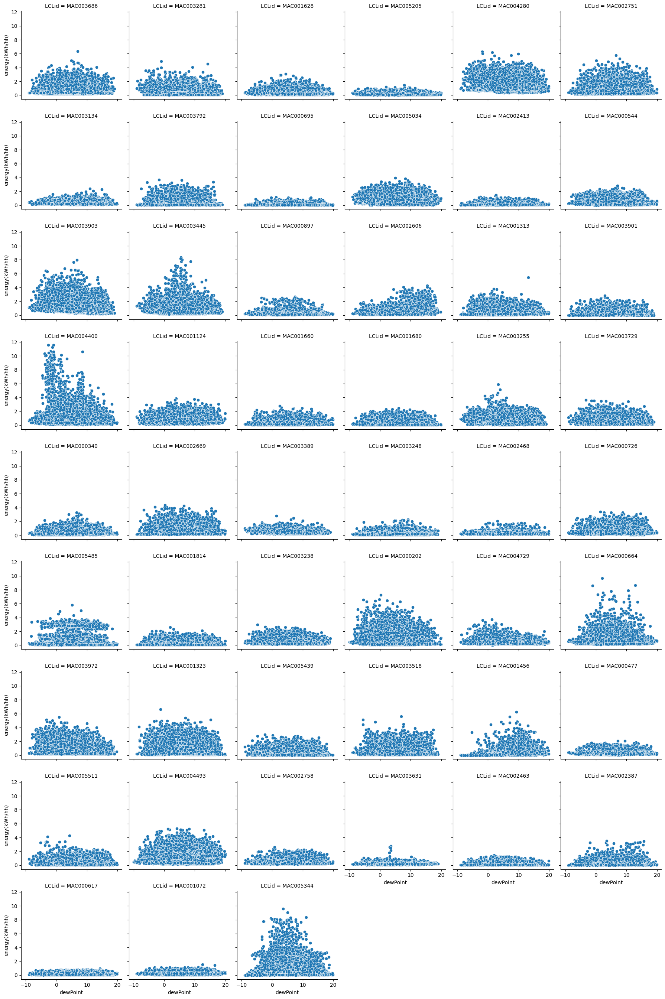

In [92]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="dewPoint", y="energy(kWh/hh)")

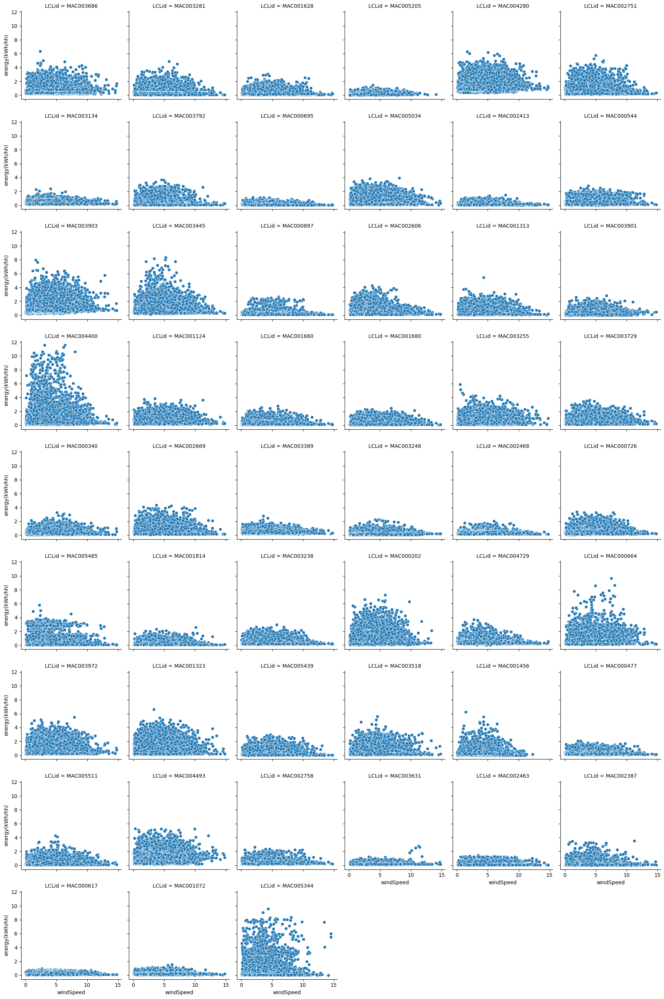

In [93]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="windSpeed", y="energy(kWh/hh)")

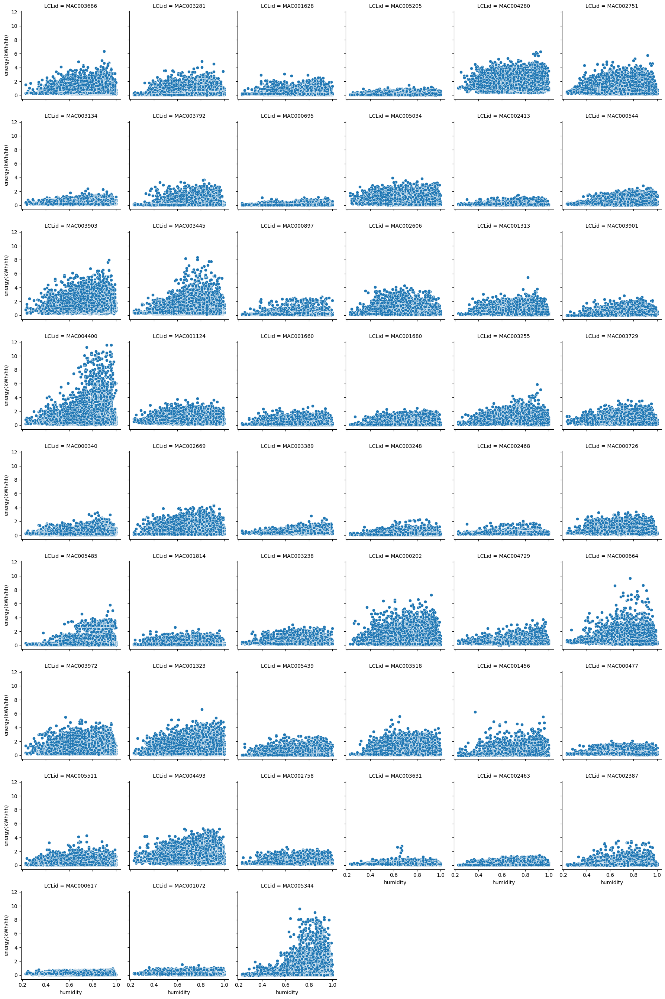

In [94]:
g = sns.FacetGrid(df, col='LCLid', col_wrap=6)
g.map_dataframe(sns.scatterplot, x="humidity", y="energy(kWh/hh)")

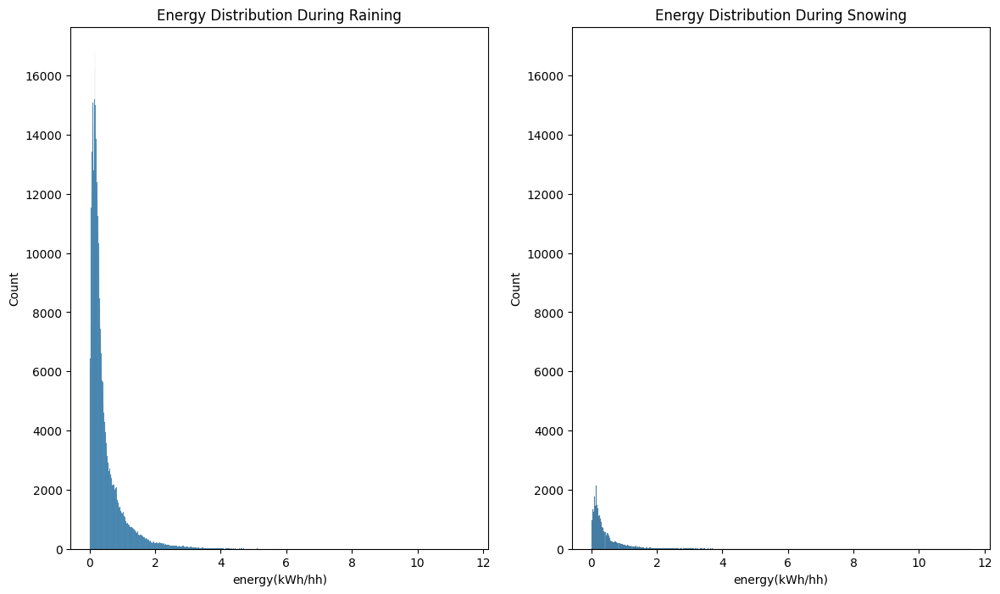

In [9]:
plt.figure(figsize=(14, 8))

ax1 = plt.subplot(1, 2, 1)
sns.histplot(data=df.loc[df['precipType'] == 'rain'], x='energy(kWh/hh)')
plt.title("Energy Distribution During Raining")

ax2 = plt.subplot(1, 2, 2, sharex=ax1, sharey=ax1)
sns.histplot(data=df.loc[df['precipType'] == 'snow'], x='energy(kWh/hh)')
plt.title("Energy Distribution During Snowing")

plt.show()

In [34]:
print("Row size by each weather summary:\n")

df['summary'].value_counts()

Row size by each weather summary:



Partly Cloudy               225227
Clear                       215704
Mostly Cloudy               214843
Overcast                     42327
Foggy                        19754
Breezy and Mostly Cloudy     13496
Breezy and Partly Cloudy      9325
Breezy                        8889
Breezy and Overcast           3904
Windy                          855
Windy and Mostly Cloudy        800
Windy and Overcast             428
Windy and Partly Cloudy          6
Name: summary, dtype: int64

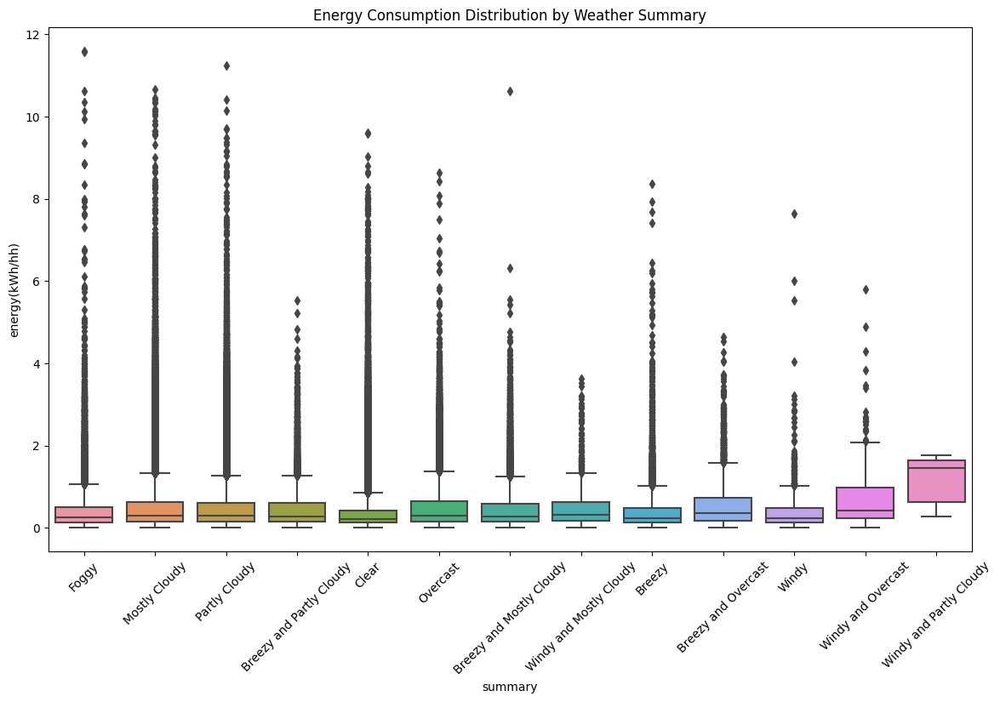

In [25]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='summary', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by Weather Summary")
plt.xticks(rotation=45)
plt.show()

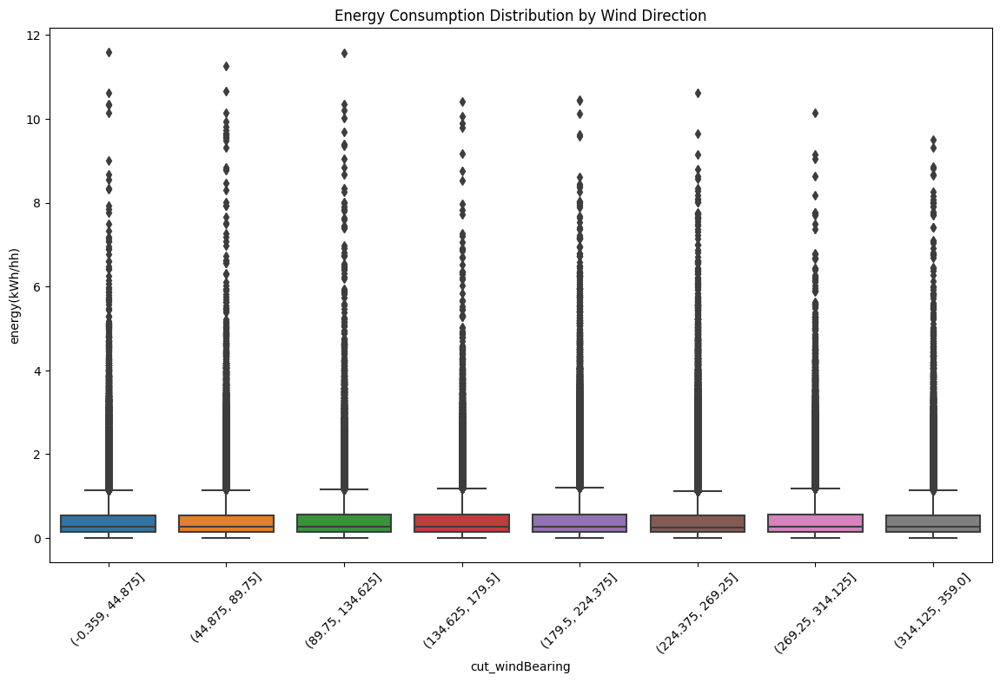

In [26]:
df['cut_windBearing'] = pd.cut(df['windBearing'], bins=8)

plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='cut_windBearing', y='energy(kWh/hh)')
plt.title("Energy Consumption Distribution by Wind Direction")
plt.xticks(rotation=45)
plt.show()

In [6]:
df.columns[-24:]

Index(['shifted_energy_1h', 'shifted_energy_2h', 'shifted_energy_3h',
       'shifted_energy_4h', 'shifted_energy_5h', 'shifted_energy_6h',
       'shifted_energy_7h', 'shifted_energy_8h', 'shifted_energy_9h',
       'shifted_energy_10h', 'shifted_energy_11h', 'shifted_energy_12h',
       'shifted_energy_13h', 'shifted_energy_14h', 'shifted_energy_15h',
       'shifted_energy_16h', 'shifted_energy_17h', 'shifted_energy_18h',
       'shifted_energy_19h', 'shifted_energy_20h', 'shifted_energy_21h',
       'shifted_energy_22h', 'shifted_energy_23h', 'shifted_energy_24h'],
      dtype='object')

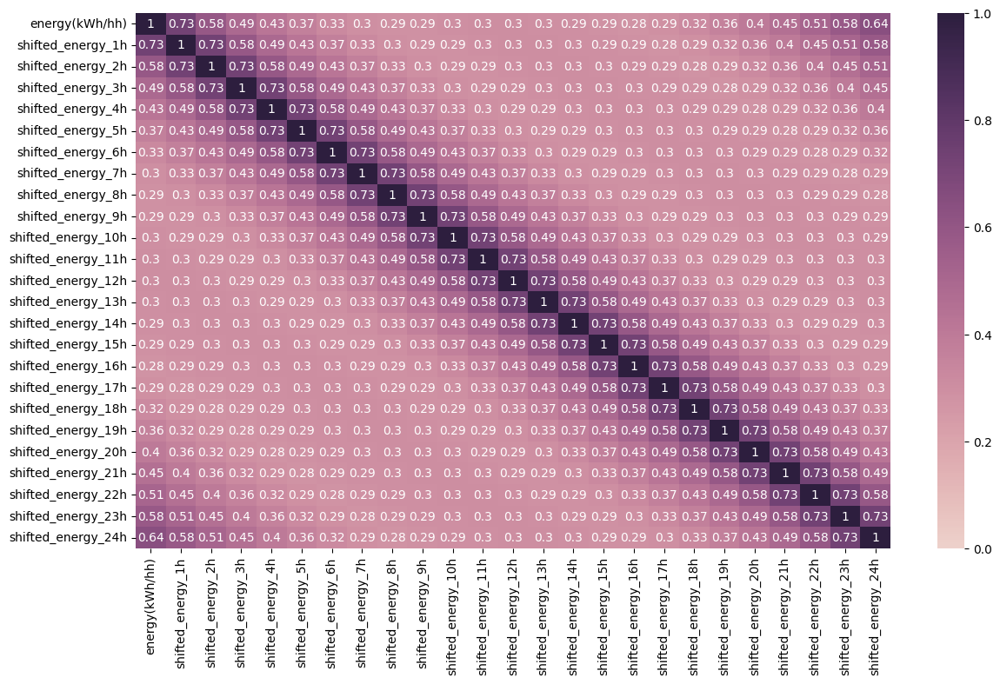

In [7]:
corr_matrix = df[['energy(kWh/hh)', 'shifted_energy_1h', 'shifted_energy_2h', 'shifted_energy_3h',
       'shifted_energy_4h', 'shifted_energy_5h', 'shifted_energy_6h',
       'shifted_energy_7h', 'shifted_energy_8h', 'shifted_energy_9h',
       'shifted_energy_10h', 'shifted_energy_11h', 'shifted_energy_12h',
       'shifted_energy_13h', 'shifted_energy_14h', 'shifted_energy_15h',
       'shifted_energy_16h', 'shifted_energy_17h', 'shifted_energy_18h',
       'shifted_energy_19h', 'shifted_energy_20h', 'shifted_energy_21h',
       'shifted_energy_22h', 'shifted_energy_23h', 'shifted_energy_24h']].corr()

plt.figure(figsize=(14, 8))
sns.heatmap(corr_matrix, vmin=0, vmax=1, cmap=sns.cubehelix_palette(as_cmap=True), annot=True)
plt.show()